In [1]:
import torch
from torch.nn import CrossEntropyLoss
from torch.utils.data import DataLoader
import numpy as np
import os
import nrrd
import pytorch_lightning as pl #python -m pip install lightning
from monai.data import Dataset, DataLoader
from monai.transforms import Compose, Lambda, RandSpatialCrop, RandRotate90, ToTensor
from monai.networks.nets import AutoEncoder
#from monai.losses import DiceLoss
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from pytorch_lightning.callbacks import ModelCheckpoint
import torch.nn as nn
import torch.optim.lr_scheduler as lr_scheduler
import time

In [2]:
class SlicePlotter:
    def __init__(self):
        pass

    def plot_slices(self, original_slice, reconstruction_slice, title):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(original_slice, cmap='gray')
        plt.title(f'Original {title} Slice')
        plt.subplot(1, 2, 2)
        plt.imshow(reconstruction_slice, cmap='gray')
        plt.title(f'Reconstructed {title} Slice')
        plt.show()

class VolumePlotter:
    def __init__(self):
        self.color_map = np.array([
            [0, 0, 0, 0],      # Transparent for background (0)
            [255, 0, 0, 255],  # Red for arteries (1)
            [0, 0, 255, 255]   # Blue for veins (2)
        ], dtype=np.uint8)
        self.downsample_factor = 2

    def plot_volumes(self, original_volume, reconstruction_volume, title):
        # Downsample original volume
        original_volume_downsampled = original_volume[::self.downsample_factor, 
                                                       ::self.downsample_factor, 
                                                       ::self.downsample_factor]

        # Downsample reconstructed volume
        reconstruction_volume_downsampled = reconstruction_volume[::self.downsample_factor, 
                                                                   ::self.downsample_factor, 
                                                                   ::self.downsample_factor]

        # Downsample color map along the first axis to match the number of unique values in the downsampled volume
        color_map_downsampled = self.color_map[:len(np.unique(original_volume_downsampled))]

        # Plot original and reconstructed volumes with titles using Matplotlib
        fig = plt.figure(figsize=(10, 5))

        # Plot original volume with assigned colors and no edge color
        ax1 = fig.add_subplot(121, projection='3d')
        ax1.set_title(f'Original {title} Volume')

        # Define colors for each voxel value in the original volume using the downsampled color map
        original_colors = np.take(color_map_downsampled, original_volume_downsampled, axis=0) / 255.0
        ax1.voxels(original_volume_downsampled, facecolors=original_colors)

        # Plot reconstructed volume with assigned colors and no edge color
        ax2 = fig.add_subplot(122, projection='3d')
        ax2.set_title(f'Reconstructed {title} Volume')

        # Define colors for each voxel value in the reconstructed volume using the downsampled color map
        reconstruction_colors = np.take(color_map_downsampled, reconstruction_volume_downsampled, axis=0) / 255.0
        ax2.voxels(reconstruction_volume_downsampled, facecolors=reconstruction_colors)

        plt.show()

class AutoEncoderModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.autoencoder = AutoEncoder(
            spatial_dims=3, 
            in_channels=1, 
            out_channels=3,  # Output channels set to 3
            channels=(16, 32, 64, 128, 2), 
            strides=(2, 2, 2, 2, 2), 
            kernel_size=3, 
            num_res_units=2
        )
        # Define class weights
        class_weights = torch.tensor([0.2, 0.4, 0.4])
        self.loss_function = nn.CrossEntropyLoss(weight=class_weights)
        self.volume_plotter = VolumePlotter()  # Instantiate VolumePlotter

    def forward(self, x):
        return self.autoencoder(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        x, y = x.to(device), y.to(device)
        x_hat = self(x)
        loss = self.loss_function(x_hat, y.squeeze(1).long())
        self.log('train_loss', loss)

        if (self.current_epoch) % 300 == 0 and batch_idx == 0:
            original_volume = x[0, 0, :, :, :].detach().cpu().numpy().astype(int)  
            reconstruction_volume = np.argmax(x_hat[0,:,:,:,:].detach().cpu().numpy(), axis=0)
            self.volume_plotter.plot_volumes(original_volume, reconstruction_volume, 'Train')

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        x, y = x.to(device), y.to(device)
        x_hat = self(x)
        loss = self.loss_function(x_hat, y.squeeze(1).long())
        self.log('val_loss', loss, prog_bar=True)

        if (self.current_epoch) % 300 == 0 and batch_idx == 0:
            original_volume = x[0, 0, :, :, :].detach().cpu().numpy().astype(int)  
            reconstruction_volume = np.argmax(x_hat[0,:,:,:,:].detach().cpu().numpy(), axis=0)
            self.volume_plotter.plot_volumes(original_volume, reconstruction_volume, 'Val')
            torch.save(model.state_dict(), folder_path + '/autoencoder.pth')

        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        return optimizer

class MyDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.files = [f for f in os.listdir(data_dir) if f.endswith('.nrrd')]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_path = os.path.join(self.data_dir, self.files[idx])
        data, header = nrrd.read(file_path)
        if self.transform:
            data = self.transform(data)
        return data, data

# Define a custom callback to plot both training and validation losses

class PlotLossCallback(pl.Callback):
    def __init__(self, log_dir):
        super().__init__()
        self.log_dir = log_dir

    def on_train_start(self, trainer, pl_module):
        # Clear previous graphs
        #tf.compat.v1.reset_default_graph()
        self.writer = SummaryWriter(self.log_dir)

    def on_train_epoch_end(self, trainer, pl_module, **kwargs):
        epoch = trainer.current_epoch
        train_loss = trainer.callback_metrics['train_loss'].cpu().item()
        val_loss = trainer.callback_metrics['val_loss'].cpu().item()

        # Write both training and validation loss to the same graph with epoch as global step
        self.writer.add_scalars('MAE Job 16 Loss', {'training' : train_loss, 
                                                   'validation' : val_loss }, global_step=epoch +1 )
        time_spent = time.time() - start_time
        print(f"Time Spent {time_spent:.2f}")
    def on_train_end(self, trainer, pl_module):
        self.writer.close()

transform = Compose([
    Lambda(func=lambda x: np.expand_dims(x, 0) if x.ndim == 3 else x),
    RandSpatialCrop((256, 256, 256), random_size=False),
    RandRotate90(prob=0.5),
    ToTensor(dtype=torch.float32)
])

start_time = time.time()
device = torch.device("cuda" if torch.cuda.is_available() else "gpu")

folder_path = "./Models"
if not os.path.exists(folder_path):
        os.makedirs(folder_path)

# Define dataset and data loaders for both training and validation sets
train_data_dir = "../../TrainFullLabels70"
val_data_dir   = "../../ValFullLabels30"

train_dataset = MyDataset(train_data_dir, transform)
val_dataset   = MyDataset(val_data_dir  , transform)

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True , num_workers=2) #############################
val_dataloader   = DataLoader(val_dataset  , batch_size=2, shuffle=False, num_workers=2)


#early_stop_callback = pl.callbacks.EarlyStopping(monitor='val_loss', patience=80)
#getting rid of early stop callback for now 
# Define Lightning trainer

trainer = pl.Trainer(
    max_epochs=1501,
    callbacks=[PlotLossCallback("../../logs/")],
    profiler='simple')


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


Missing logger folder: /old_Users/tgafrick/RA4/jobs/MAEjob16/lightning_logs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]



  | Name          | Type             | Params
---------------------------------------------------
0 | autoencoder   | AutoEncoder      | 2.1 M 
1 | loss_function | CrossEntropyLoss | 0     
---------------------------------------------------
2.1 M     Trainable params
0         Non-trainable params
2.1 M     Total params
8.282     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

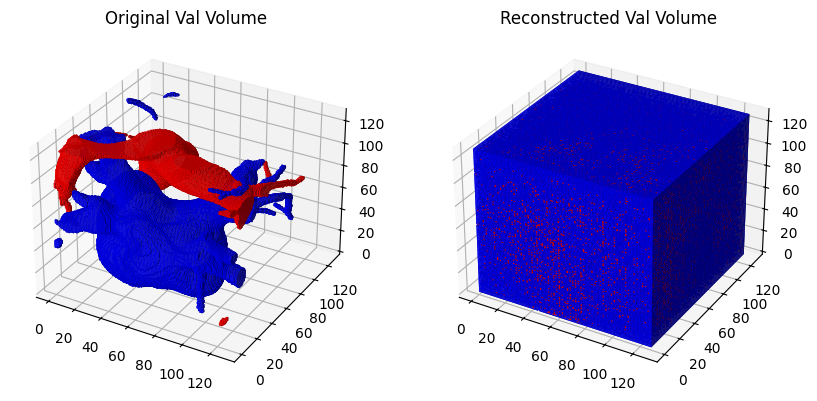

/old_Users/tgafrick/RA4/.venvE/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

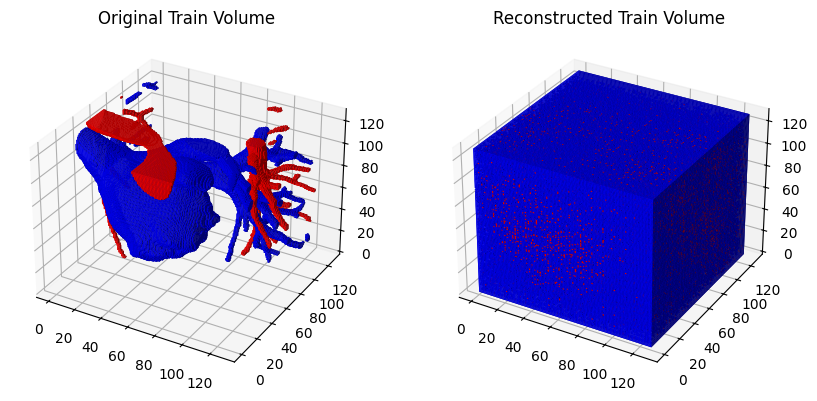

Validation: |          | 0/? [00:00<?, ?it/s]

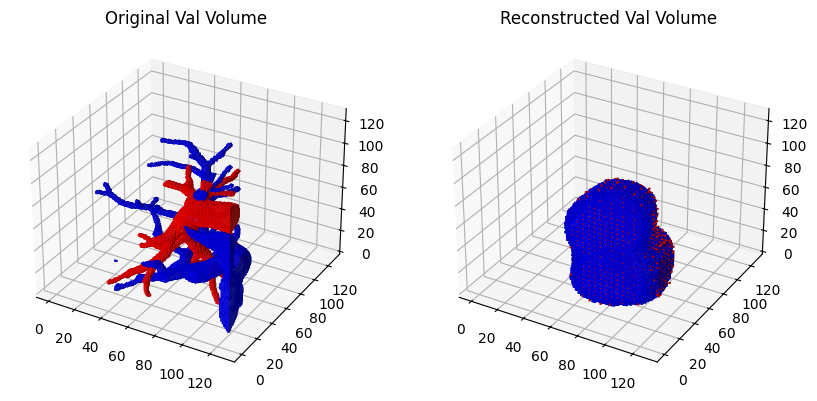

Time Spent 3778.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 3813.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 3847.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 3884.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 3919.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 3954.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 3988.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4023.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4057.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4091.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4126.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4160.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4194.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4229.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4264.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4300.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4337.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4377.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4411.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4446.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4482.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4517.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4551.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4586.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4621.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4658.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4693.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4727.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4762.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4798.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4832.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4867.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4901.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4936.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 4970.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5005.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5040.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5074.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5111.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5145.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5181.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5216.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5252.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5287.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5324.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5360.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5394.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5428.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5463.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5499.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5535.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5570.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5605.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5640.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5675.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5710.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5745.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5780.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5816.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5850.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5884.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5920.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5957.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 5994.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6029.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6063.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6098.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6135.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6170.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6205.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6240.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6275.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6310.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6345.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6379.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6415.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6450.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6486.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6521.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6556.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6591.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6625.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6660.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6697.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6732.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6769.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6805.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6839.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6876.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6910.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6945.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 6980.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7016.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7053.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7088.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7123.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7158.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7194.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7230.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7267.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7302.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7336.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7372.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7407.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7441.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7478.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7513.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7550.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7585.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7620.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7656.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7691.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7728.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7764.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7799.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7835.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7869.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7904.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7940.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 7975.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8009.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8044.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8081.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8115.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8150.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8186.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8222.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8257.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8292.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8327.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8364.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8399.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8434.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8469.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8505.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8540.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8575.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8610.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8647.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8682.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8716.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8753.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8788.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8823.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8857.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8895.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8932.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 8967.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9004.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9041.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9078.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9113.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9148.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9182.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9217.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9252.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9288.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9324.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9359.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9394.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9429.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9466.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9503.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9538.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9573.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9607.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9643.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9679.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9714.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9751.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9788.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9823.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9860.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9894.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9929.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 9965.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10000.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10035.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10069.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10104.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10139.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10173.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10209.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10244.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10279.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10314.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10349.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10384.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10418.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10454.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10489.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10523.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10558.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10593.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10627.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10662.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10697.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10734.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10771.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10808.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10844.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10879.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10914.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10948.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 10984.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11019.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11055.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11091.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11125.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11159.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11194.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11230.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11265.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11301.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11336.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11374.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11409.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11443.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11480.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11515.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11553.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11589.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11624.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11659.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11699.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11741.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11778.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11814.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11862.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 11969.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12037.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12101.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12136.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12171.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12206.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12240.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12275.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12311.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12347.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12382.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12416.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12451.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12488.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12525.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12561.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12596.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12631.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12666.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12702.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12741.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12788.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12823.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12868.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12903.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12938.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 12975.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13009.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13045.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13080.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13116.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13152.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13188.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13224.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13261.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13306.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13341.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13376.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13410.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13447.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13481.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13518.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13554.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13591.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13629.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13666.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13700.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13735.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13771.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13807.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13841.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13876.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13911.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13946.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 13981.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14017.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14051.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14087.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14121.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14156.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14191.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14225.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14261.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14296.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14331.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14366.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14402.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14436.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14471.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14506.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 14545.04


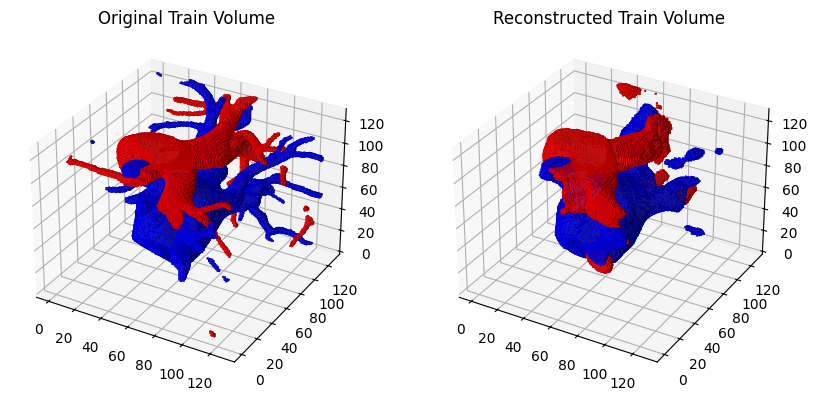

Validation: |          | 0/? [00:00<?, ?it/s]

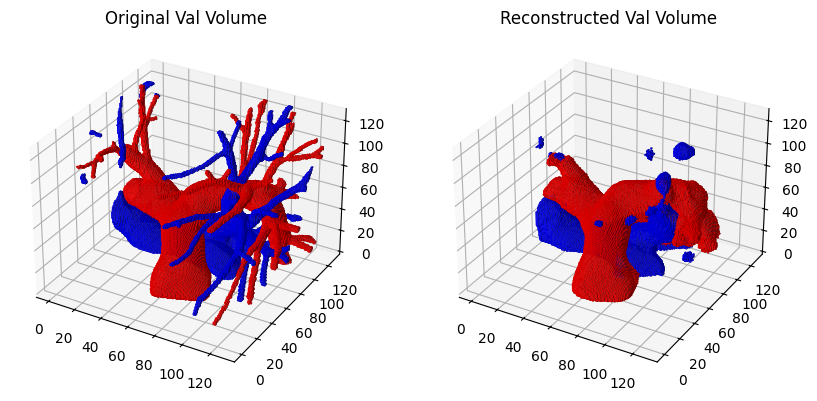

Time Spent 15110.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15144.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15180.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15215.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15249.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15284.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15318.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15353.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15388.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15423.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15457.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15492.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15526.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15560.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15596.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15630.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15665.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15700.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15736.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15772.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15806.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15840.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15875.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15909.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15942.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 15978.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16012.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16046.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16080.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16115.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16150.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16186.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16220.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16254.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16290.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16323.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16358.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16393.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16427.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16462.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16498.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16532.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16567.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16601.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16635.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16669.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16703.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16738.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16773.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16809.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16844.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16880.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16914.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16950.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 16985.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17019.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17053.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17087.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17121.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17156.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17191.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17225.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17260.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17295.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17330.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17364.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17399.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17434.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17468.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17502.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17537.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17573.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17607.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17642.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17678.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17712.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17748.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17782.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17817.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17851.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17886.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17920.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17954.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 17990.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18026.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18061.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18096.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18130.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18166.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18201.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18236.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18270.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18305.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18339.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18376.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18411.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18445.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18480.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18514.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18551.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18586.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18620.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18655.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18689.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18723.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18757.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18791.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18828.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18863.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18898.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18932.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 18968.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19002.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19036.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19070.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19105.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19140.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19176.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19211.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19245.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19280.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19314.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19348.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19382.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19416.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19451.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19486.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19519.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19554.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19588.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19623.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19658.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19693.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19729.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19764.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19798.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19833.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19867.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19901.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19937.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 19972.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20006.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20041.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20076.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20113.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20148.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20182.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20218.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20252.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20289.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20323.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20357.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20391.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20427.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20462.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20496.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20530.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20564.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20600.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20634.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20667.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20701.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20736.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20769.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20802.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20836.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20872.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20905.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20939.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 20973.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21007.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21042.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21076.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21110.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21146.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21180.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21213.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21248.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21282.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21316.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21351.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21385.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21420.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21456.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21492.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21527.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21562.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21596.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21630.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21664.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21698.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21731.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21766.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21801.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21836.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21870.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21904.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21938.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 21972.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22008.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22042.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22076.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22111.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22145.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22179.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22213.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22247.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22281.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22315.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22349.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22384.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22418.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22452.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22488.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22523.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22557.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22593.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22627.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22661.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22697.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22730.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22764.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22798.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22831.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22865.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22899.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22933.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 22966.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23000.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23034.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23067.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23101.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23135.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23169.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23202.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23236.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23270.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23304.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23339.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23373.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23407.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23441.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23476.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23511.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23544.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23579.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23613.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23647.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23683.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23722.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23757.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23791.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23825.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23860.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23893.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23928.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23961.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 23995.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24030.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24065.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24100.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24134.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24168.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24202.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24236.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24269.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24304.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24337.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24371.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24404.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24439.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24474.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24508.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24542.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24578.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24611.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24645.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24681.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24715.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24751.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24785.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24819.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24853.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24887.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24921.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24954.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 24990.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25026.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25059.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25095.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25130.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25164.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25198.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25232.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25266.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25300.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25333.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25367.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25400.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25437.20


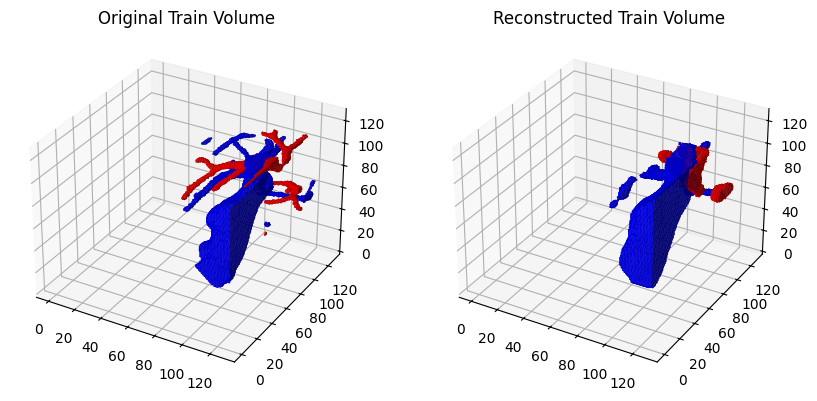

Validation: |          | 0/? [00:00<?, ?it/s]

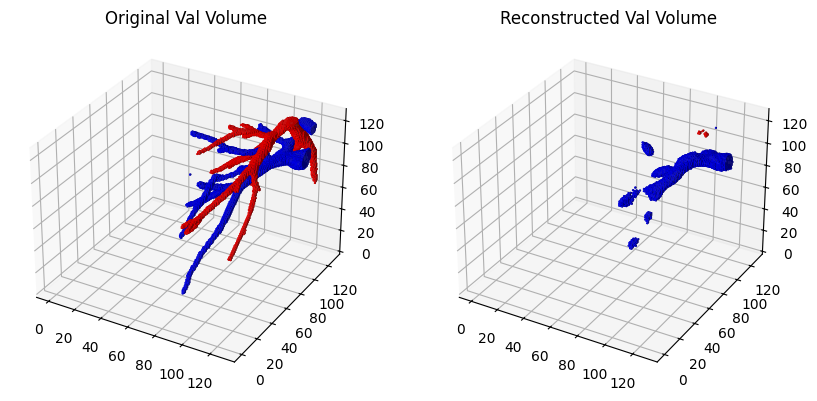

Time Spent 25713.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25747.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25781.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25815.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25849.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25883.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25917.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25951.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 25985.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26019.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26052.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26086.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26119.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26155.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26189.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26222.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26257.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26292.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26325.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26359.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26393.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26426.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26463.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26496.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26530.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26565.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26601.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26635.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26668.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26702.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26736.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26770.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26805.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26839.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26874.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26908.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26942.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 26976.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27012.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27046.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27080.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27114.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27147.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27180.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27214.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27248.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27283.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27318.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27352.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27388.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27422.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27456.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27489.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27523.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27556.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27590.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27623.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27657.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27691.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27725.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27759.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27793.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27828.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27862.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27897.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27930.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27965.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 27999.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28033.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28067.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28102.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28136.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28170.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28205.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28239.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28275.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28308.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28342.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28376.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28409.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28443.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28477.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28511.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28546.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28581.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28615.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28649.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28683.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28719.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28752.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28788.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28822.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28856.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28890.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28923.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28957.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 28991.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29025.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29058.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29094.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29130.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29164.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29198.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29231.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29265.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29299.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29333.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29368.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29402.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29435.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29471.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29505.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29539.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29574.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29609.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29643.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29677.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29711.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29745.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29780.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29815.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29849.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29883.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29916.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29950.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 29985.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30020.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30054.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30088.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30123.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30156.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30190.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30225.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30260.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30294.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30328.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30362.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30395.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30430.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30463.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30498.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30532.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30568.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30602.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30635.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30669.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30703.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30737.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30773.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30809.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30843.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30877.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30910.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30944.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 30978.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31012.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31045.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31081.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31116.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31152.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31185.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31219.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31253.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31286.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31320.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31354.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31388.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31422.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31457.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31490.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31523.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31557.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31590.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31624.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31658.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31692.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31726.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31761.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31795.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31829.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31865.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31899.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31932.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 31966.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32002.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32036.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32071.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32105.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32140.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32174.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32208.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32241.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32274.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32307.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32341.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32375.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32411.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32445.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32479.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32515.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32548.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32582.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32617.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32651.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32685.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32718.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32751.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32787.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32820.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32855.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32889.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32923.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32957.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 32990.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33024.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33058.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33091.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33126.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33161.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33194.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33229.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33263.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33300.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33333.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33367.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33402.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33435.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33471.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33506.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33540.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33574.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33608.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33641.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33675.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33709.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33742.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33776.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33810.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33844.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33880.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33914.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33949.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 33985.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34019.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34054.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34090.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34124.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34158.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34192.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34230.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34264.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34298.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34332.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34365.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34400.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34437.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34470.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34503.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34537.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34571.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34606.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34639.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34674.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34710.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34743.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34777.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34810.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34844.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34880.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34914.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34947.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 34982.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35017.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35051.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35084.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35118.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35151.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35185.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35219.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35253.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35287.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35321.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35354.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35389.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35423.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35456.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35490.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35524.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35557.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35591.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35626.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35661.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35695.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35729.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35764.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35799.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35832.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35866.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35900.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 35936.10


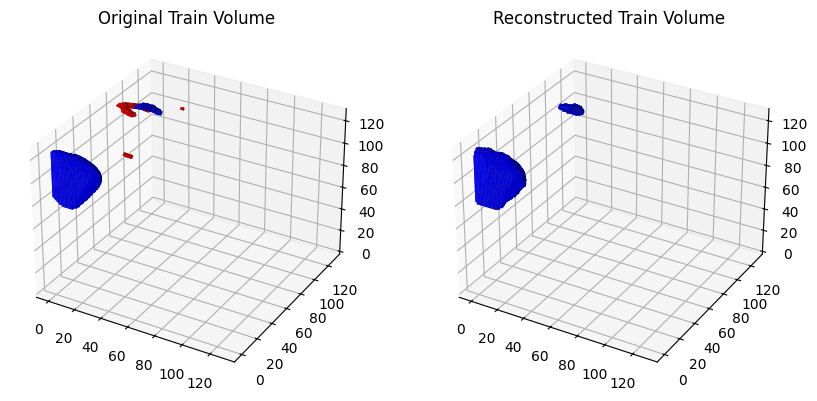

Validation: |          | 0/? [00:00<?, ?it/s]

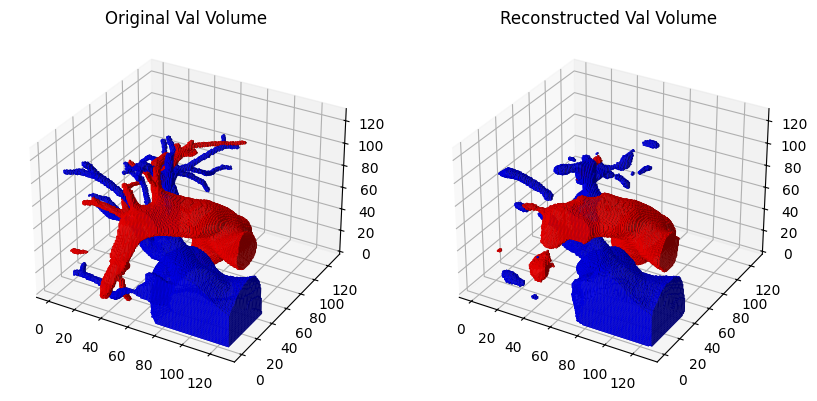

Time Spent 36297.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36331.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36365.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36400.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36434.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36468.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36501.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36536.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36571.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36605.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36640.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36675.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36708.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36741.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36775.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36809.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36842.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36876.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36912.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36946.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 36979.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37013.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37047.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37080.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37114.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37148.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37182.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37216.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37249.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37283.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37317.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37351.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37384.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37418.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37451.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37487.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37520.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37554.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37589.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37623.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37657.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37692.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37728.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37761.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37796.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37828.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37863.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37898.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37931.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 37967.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38003.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38036.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38069.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38103.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38137.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38171.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38204.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38241.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38274.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38308.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38342.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38376.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38413.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38446.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38480.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38514.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38549.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38583.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38618.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38653.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38687.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38721.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38755.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38788.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38822.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38856.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38891.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38925.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38959.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 38993.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39028.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39063.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39097.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39130.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39164.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39198.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39234.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39267.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39301.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39336.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39369.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39403.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39439.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39473.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39506.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39540.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39573.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39607.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39640.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39676.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39710.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39743.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39776.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39810.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39845.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39880.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39914.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39949.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 39983.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40017.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40051.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40084.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40120.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40155.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40189.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40223.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40257.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40290.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40325.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40359.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40393.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40427.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40460.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40494.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40528.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40562.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40595.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40630.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40665.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40699.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40732.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40766.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40799.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40834.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40869.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40903.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40936.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 40969.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41002.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41038.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41073.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41107.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41140.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41174.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41207.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41241.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41274.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41308.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41341.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41377.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41410.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41444.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41478.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41512.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41546.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41579.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41613.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41646.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41682.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41715.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41749.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41782.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41816.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41850.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41883.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41917.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41951.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 41985.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42018.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42052.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42085.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42118.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42152.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42186.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42219.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42255.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42288.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42322.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42356.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42391.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42425.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42458.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42492.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42526.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42560.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42593.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42627.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42661.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42694.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42728.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42763.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42797.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42831.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42865.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42900.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42933.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 42968.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43004.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43037.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43074.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43107.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43142.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43175.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43209.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43243.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43276.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43312.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43346.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43381.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43415.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43448.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43484.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43517.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43550.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43583.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43619.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43653.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43686.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43720.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43753.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43787.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43823.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43858.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43892.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43925.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43958.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 43994.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44028.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44064.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44097.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44131.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44165.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44198.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44232.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44268.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44304.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44339.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44374.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44408.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44441.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44476.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44510.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44544.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44578.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44611.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44647.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44681.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44715.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44748.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44784.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44818.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44852.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44887.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44920.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44954.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 44987.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45021.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45055.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45092.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45125.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45160.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45196.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45231.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45264.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45298.31


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45332.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45365.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45399.98


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45433.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45466.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45502.08


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45536.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45571.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45606.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45641.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45675.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45710.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45743.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45777.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45810.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45843.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45877.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45911.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45946.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 45981.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46014.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46048.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46082.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46115.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46150.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46185.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46219.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46253.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46287.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46320.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46356.14


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46391.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46425.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46458.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46495.12


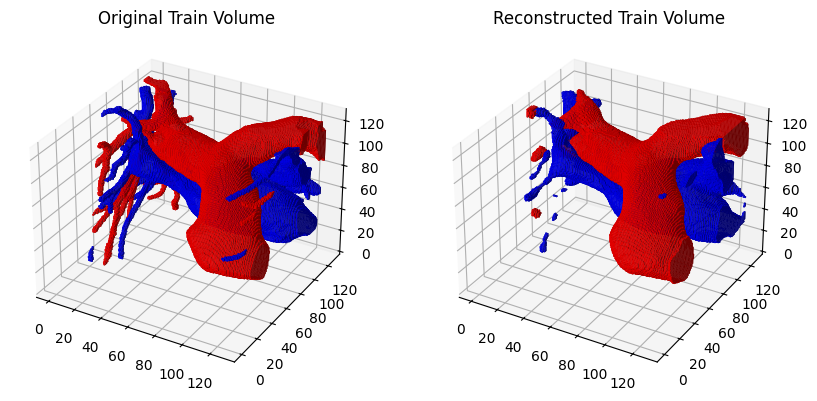

Validation: |          | 0/? [00:00<?, ?it/s]

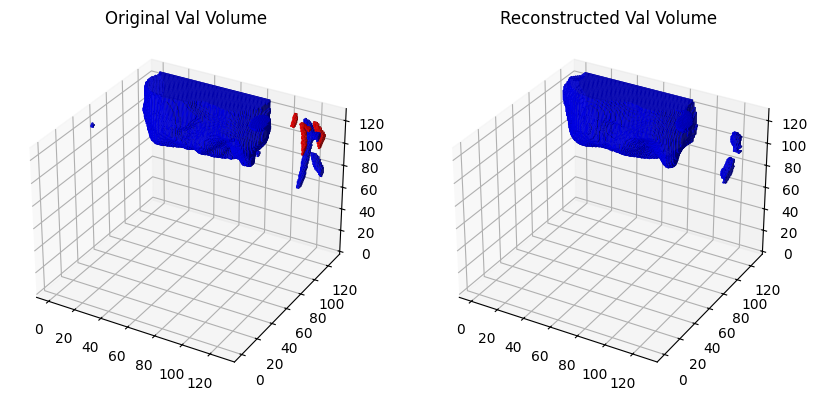

Time Spent 46939.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 46973.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47007.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47041.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47074.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47107.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47141.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47175.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47209.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47242.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47276.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47311.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47345.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47380.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47415.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47450.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47483.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47518.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47552.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47585.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47619.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47652.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47688.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47722.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47757.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47791.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47825.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47859.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47892.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47927.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47961.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 47994.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48028.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48063.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48097.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48131.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48164.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48198.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48232.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48268.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48304.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48338.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48371.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48406.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48440.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48477.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48513.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48548.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48583.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48619.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48653.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48688.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48722.03


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48755.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48788.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48822.65


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48856.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48889.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48922.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48957.07


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 48990.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49024.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49059.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49095.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49130.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49166.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49200.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49234.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49268.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49301.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49335.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49368.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49402.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49438.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49471.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49505.16


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49540.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49574.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49609.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49643.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49676.71


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49710.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49745.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49778.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49812.04


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49846.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49879.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49915.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49948.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 49982.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50015.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50050.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50084.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50118.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50152.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50185.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50219.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50253.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50286.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50324.88


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50358.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50392.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50425.91


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50459.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50492.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50527.90


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50561.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50595.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50630.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50663.59


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50698.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50732.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50767.26


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50802.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50836.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50869.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50902.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50936.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 50970.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51004.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51037.50


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51072.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51106.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51140.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51173.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51207.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51240.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51276.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51310.13


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51346.00


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51380.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51413.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51448.60


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51481.61


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51516.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51551.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51585.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51618.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51651.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51685.42


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51719.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51752.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51786.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51819.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51855.02


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51889.33


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51922.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51956.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 51990.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52027.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52061.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52094.85


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52128.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52162.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52196.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52229.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52265.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52299.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52334.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52368.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52401.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52437.30


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52470.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52505.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52539.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52573.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52608.66


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52643.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52676.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52710.20


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52745.28


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52781.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52814.55


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52849.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52884.94


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52918.47


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52952.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 52985.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53020.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53054.27


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53087.87


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53120.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53155.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53189.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53222.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53256.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53292.24


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53325.79


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53359.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53393.36


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53426.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53462.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53495.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53529.72


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53563.68


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53598.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53631.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53665.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53698.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53735.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53769.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53802.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53836.22


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53871.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53904.51


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53938.35


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 53971.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54005.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54039.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54072.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54106.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54142.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54175.32


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54210.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54244.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54280.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54314.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54348.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54381.67


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54414.86


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54448.75


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54482.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54516.54


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54549.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54583.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54616.83


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54650.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54684.78


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54718.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54754.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54789.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54822.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54858.18


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54891.74


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54927.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54960.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 54994.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55028.15


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55060.92


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55096.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55129.56


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55165.46


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55199.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55232.95


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55268.12


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55301.93


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55336.41


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55371.38


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55404.97


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55442.37


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55475.89


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55510.82


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55545.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55578.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55612.29


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55647.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55680.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55714.23


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55747.43


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55782.77


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55816.10


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55849.70


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55883.06


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55917.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55950.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 55986.01


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56021.21


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56054.69


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56087.84


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56121.73


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56155.17


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56188.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56221.81


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56255.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56288.57


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56321.80


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56356.25


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56389.40


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56423.58


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56457.44


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56492.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56525.96


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56559.63


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56593.34


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56629.11


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56662.62


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56695.48


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56729.09


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56762.64


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56798.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56832.53


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56868.05


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56903.19


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56937.45


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 56972.52


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57006.39


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57039.49


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57072.76


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57107.99


Validation: |          | 0/? [00:00<?, ?it/s]

Time Spent 57143.54


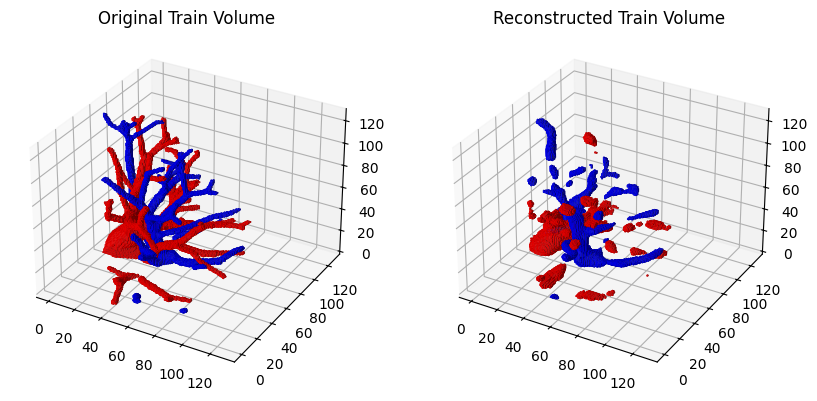

Validation: |          | 0/? [00:00<?, ?it/s]

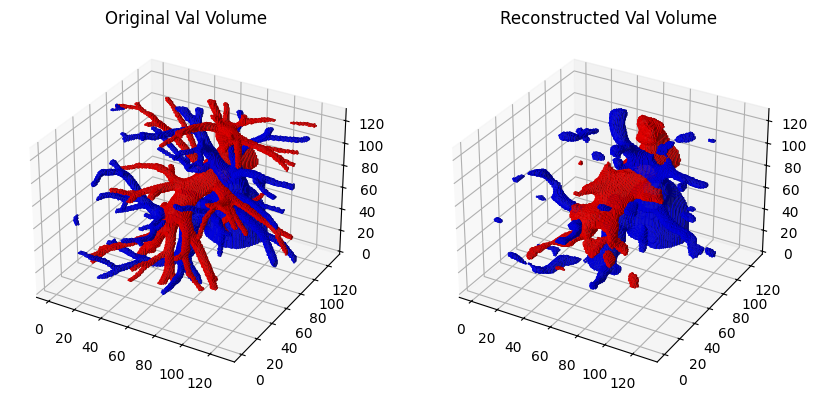

`Trainer.fit` stopped: `max_epochs=1501` reached.


Time Spent 57544.47


FIT Profiler Report

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                         	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                                                                                                          	|  -              	|  723580         	|

In [3]:
model = AutoEncoderModel()
trainer.fit(model, train_dataloader, val_dataloader)

In [4]:
torch.save(model.state_dict(), folder_path + '/ae1.pth')